In [107]:
#Importing all relevant libraries and packages
import pandas as pd
import numpy as np
import networkx as nx
import re
import matplotlib.pyplot as plt
import string
import nltk 
import os
from collections import Counter
import seaborn as sns
from nltk.corpus import stopwords
nltk.download('punkt')
from nltk import bigrams
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
from nltk.corpus.reader.ycoe import wordpunct_tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# TASK 1

In [108]:
#File uploading
from google.colab import files
data = files.upload()

Saving Keyword_data - Keyword_data.csv to Keyword_data - Keyword_data (3).csv


In [109]:
#File reading and storing it to a dataframe df
df = pd.read_csv('Keyword_data - Keyword_data.csv')
df

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Feb/03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Meta-Analyses of Financial Performance and Equ...,EQUITY,ORGANIZATIONAL sociology,PERFORMANCE,META-analysis,PSYCHOMETRICS,ORGANIZATIONAL research,FINANCIAL performance,AGENCY theory,ORGANIZATIONAL effectiveness,ORGANIZATIONAL behavior,CORPORATE governance,NaN
3,"Home Country Environments, Corporate Diversifi...",DIVERSIFICATION in industry,BUSINESS planning,PERFORMANCE standards,EMPLOYEES -- Rating of,CORPORATE culture,STRATEGIC planning,ORGANIZATIONAL effectiveness,MANAGEMENT science,MANAGEMENT research,PRODUCT management,NaN,NaN
4,Safeguarding Investments in Asymmetric Interor...,INTERORGANIZATIONAL relations,INTERGROUP relations,BUSINESS communication,INVESTMENTS,SUPPLY chains,KNOWLEDGE management,INTERORGANIZATIONAL networks,CORPORATE governance,GROUP decision making,INTELLECTUAL capital,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,Subsidiary Staffing in Multinational Enterpris...,INTERNATIONAL business enterprises -- Management,FOREIGN subsidiaries -- Management,EMPLOYEE selection,EXECUTIVES -- Recruiting,ORGANIZATIONAL sociology,ORGANIZATIONAL behavior,AGENCY theory,RESOURCE-based theory of the firm,PERSONNEL management,EMPLOYMENT in foreign countries,SUBSIDIARY corporations -- Management,HOST countries (Business)
62,"Strategic Human Resource Practices, Top Manage...",PERSONNEL management,COMPETITIVE advantage,BUSINESS networks,INDUSTRIAL management,STRATEGIC planning,SOCIAL networks,RESOURCE management,RESOURCE-based theory of the firm,HUMAN capital -- Management,INTELLECTUAL capital,DECISION making,INDUSTRIAL efficiency
63,Compensation Policy and Organizational Perform...,COMPENSATION management,ORGANIZATIONAL behavior,PERSONNEL management,HOSPITALS -- Administration,MANAGEMENT,FINANCIAL performance,WAGE payment systems,RESOURCE management,ORGANIZATIONAL effectiveness,INDUSTRIAL efficiency,FINANCIAL management,INDUSTRIAL management
64,"Functional Background Identity, Diversity, and...",CROSS-functional teams,TEAMS in the workplace,GROUP identity,ORGANIZATIONAL behavior,MANAGEMENT,PERFORMANCE,PERSONNEL management,COMPETITIVE advantage,ORGANIZATIONAL effectiveness,GROUP decision making,ORGANIZATIONAL structure,ORGANIZATIONAL sociology


In [110]:
df.head() #Printing top 10 rows

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Feb/03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Meta-Analyses of Financial Performance and Equ...,EQUITY,ORGANIZATIONAL sociology,PERFORMANCE,META-analysis,PSYCHOMETRICS,ORGANIZATIONAL research,FINANCIAL performance,AGENCY theory,ORGANIZATIONAL effectiveness,ORGANIZATIONAL behavior,CORPORATE governance,NaN
3,"Home Country Environments, Corporate Diversifi...",DIVERSIFICATION in industry,BUSINESS planning,PERFORMANCE standards,EMPLOYEES -- Rating of,CORPORATE culture,STRATEGIC planning,ORGANIZATIONAL effectiveness,MANAGEMENT science,MANAGEMENT research,PRODUCT management,NaN,NaN
4,Safeguarding Investments in Asymmetric Interor...,INTERORGANIZATIONAL relations,INTERGROUP relations,BUSINESS communication,INVESTMENTS,SUPPLY chains,KNOWLEDGE management,INTERORGANIZATIONAL networks,CORPORATE governance,GROUP decision making,INTELLECTUAL capital,NaN,NaN


In [111]:
df.dropna(how='all',axis='rows',inplace=True) #Dropping NAN Columns as they are of no use

In [112]:
df_clean=df #Storing the cleaned data to a new dataframe df_clean

In [113]:
df = df.reset_index() #Reseting the index

In [114]:
df=df.drop(columns='index') #droping Index Value column as it is of no use

In [115]:
df

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Feb/03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Meta-Analyses of Financial Performance and Equ...,EQUITY,ORGANIZATIONAL sociology,PERFORMANCE,META-analysis,PSYCHOMETRICS,ORGANIZATIONAL research,FINANCIAL performance,AGENCY theory,ORGANIZATIONAL effectiveness,ORGANIZATIONAL behavior,CORPORATE governance,NaN
2,"Home Country Environments, Corporate Diversifi...",DIVERSIFICATION in industry,BUSINESS planning,PERFORMANCE standards,EMPLOYEES -- Rating of,CORPORATE culture,STRATEGIC planning,ORGANIZATIONAL effectiveness,MANAGEMENT science,MANAGEMENT research,PRODUCT management,NaN,NaN
3,Safeguarding Investments in Asymmetric Interor...,INTERORGANIZATIONAL relations,INTERGROUP relations,BUSINESS communication,INVESTMENTS,SUPPLY chains,KNOWLEDGE management,INTERORGANIZATIONAL networks,CORPORATE governance,GROUP decision making,INTELLECTUAL capital,NaN,NaN
4,Managerialist and Human Capital Explanations f...,EXECUTIVE compensation,WAGES,HUMAN capital,LABOR economics,PERSONNEL management,MANAGEMENT science,CONTINGENCY theory (Management),COMPENSATION management,EXECUTIVE ability (Management),CORPORATE governance,NaN,NaN
5,Bidding Wars Over R&D-Intensive Firms: Knowled...,KNOWLEDGE management,INFORMATION resources management,MANAGEMENT information systems,BREAK-even analysis,DATA mining,MANAGEMENT science,RESEARCH & development,RESEARCH & development contracts,CORPORATE governance,DECISION making,ORGANIZATIONAL behavior,TRANSACTION costs
6,When “The Show Must Go On”: Surface Acting and...,EMOTIONS (Psychology),INTERPERSONAL relations,STRESS (Psychology),SOCIAL interaction,SOCIAL psychology,EMPLOYEES -- Attitudes,CUSTOMER services,CUSTOMER satisfaction,JOB stress,PEER review (Professional performance),NaN,NaN
7,Relationships among Supervisors' and Subordina...,SUPERVISORS,JUSTICE,CONFLICT management,MEDIATION,EMPLOYEES,INDUSTRIAL relations,ORGANIZATIONAL behavior,UNITED States -- National Guard,ORGANIZATIONAL effectiveness,DECISION making,RESOURCE allocation,NaN
8,Punctuated Equilibrium and Linear Progression:...,INDUSTRIAL relations,MANAGEMENT science,DECISION theory,ORGANIZATIONAL sociology,PUNCTUATED equilibrium (Evolution),ORGANIZATIONAL change,ORGANIZATIONAL behavior,ORGANIZATIONAL structure,BUSINESS models,ORGANIZATIONAL research,NaN,NaN
9,Apr/03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
#converting all data in the keyword colum to lower case
for i in range(1,13): #for loop as there are 12 columns
  df[f'Keyword {i}']=df[f'Keyword {i}'].str.lower() #Function to lower case

In [117]:
df

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Feb/03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Meta-Analyses of Financial Performance and Equ...,equity,organizational sociology,performance,meta-analysis,psychometrics,organizational research,financial performance,agency theory,organizational effectiveness,organizational behavior,corporate governance,NaN
2,"Home Country Environments, Corporate Diversifi...",diversification in industry,business planning,performance standards,employees -- rating of,corporate culture,strategic planning,organizational effectiveness,management science,management research,product management,NaN,NaN
3,Safeguarding Investments in Asymmetric Interor...,interorganizational relations,intergroup relations,business communication,investments,supply chains,knowledge management,interorganizational networks,corporate governance,group decision making,intellectual capital,NaN,NaN
4,Managerialist and Human Capital Explanations f...,executive compensation,wages,human capital,labor economics,personnel management,management science,contingency theory (management),compensation management,executive ability (management),corporate governance,NaN,NaN
5,Bidding Wars Over R&D-Intensive Firms: Knowled...,knowledge management,information resources management,management information systems,break-even analysis,data mining,management science,research & development,research & development contracts,corporate governance,decision making,organizational behavior,transaction costs
6,When “The Show Must Go On”: Surface Acting and...,emotions (psychology),interpersonal relations,stress (psychology),social interaction,social psychology,employees -- attitudes,customer services,customer satisfaction,job stress,peer review (professional performance),NaN,NaN
7,Relationships among Supervisors' and Subordina...,supervisors,justice,conflict management,mediation,employees,industrial relations,organizational behavior,united states -- national guard,organizational effectiveness,decision making,resource allocation,NaN
8,Punctuated Equilibrium and Linear Progression:...,industrial relations,management science,decision theory,organizational sociology,punctuated equilibrium (evolution),organizational change,organizational behavior,organizational structure,business models,organizational research,NaN,NaN
9,Apr/03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [118]:
df_dictionary = df.set_index('Title').T.to_dict('list') #Converting the data frame to a dictionary

In [119]:
df_dictionary #Displaying Dictionary data

{'Feb/03': [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 'Meta-Analyses of Financial Performance and Equity: Fusion or Confusion?': ['equity',
  'organizational sociology',
  'performance',
  'meta-analysis',
  'psychometrics',
  'organizational research',
  'financial performance',
  'agency theory',
  'organizational effectiveness',
  'organizational behavior',
  'corporate governance',
  nan],
 'Home Country Environments, Corporate Diversification Strategies, and Firm Performance': ['diversification in industry',
  'business planning',
  'performance standards',
  'employees -- rating of',
  'corporate culture',
  'strategic planning',
  'organizational effectiveness',
  'management science',
  'management research',
  'product management',
  nan,
  nan],
 'Safeguarding Investments in Asymmetric Interorganizational Relationships: Theory and Evidence': ['interorganizational relations',
  'intergroup relations',
  'business communication',
  'investments',
  'supply c

In [120]:
keyword_list = df.iloc[:,1:] #storing a new data frame inclusive of Keyword data
keyword_list

,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,equity,organizational sociology,performance,meta-analysis,psychometrics,organizational research,financial performance,agency theory,organizational effectiveness,organizational behavior,corporate governance,NaN
2,diversification in industry,business planning,performance standards,employees -- rating of,corporate culture,strategic planning,organizational effectiveness,management science,management research,product management,NaN,NaN
3,interorganizational relations,intergroup relations,business communication,investments,supply chains,knowledge management,interorganizational networks,corporate governance,group decision making,intellectual capital,NaN,NaN
4,executive compensation,wages,human capital,labor economics,personnel management,management science,contingency theory (management),compensation management,executive ability (management),corporate governance,NaN,NaN
5,knowledge management,information resources management,management information systems,break-even analysis,data mining,management science,research & development,research & development contracts,corporate governance,decision making,organizational behavior,transaction costs
6,emotions (psychology),interpersonal relations,stress (psychology),social interaction,social psychology,employees -- attitudes,customer services,customer satisfaction,job stress,peer review (professional performance),NaN,NaN
7,supervisors,justice,conflict management,mediation,employees,industrial relations,organizational behavior,united states -- national guard,organizational effectiveness,decision making,resource allocation,NaN
8,industrial relations,management science,decision theory,organizational sociology,punctuated equilibrium (evolution),organizational change,organizational behavior,organizational structure,business models,organizational research,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
#Creating a list of all sentences present in the keyword data frame
unique_list = []  #storing variable
for col in df.iloc[:,1:]: #for loop to iterate column
  for i in df.iloc[:,1:][col].dropna():
    if i not in unique_list:
      unique_list.append(i) #appending only the unique values

In [122]:
unique_list

['equity',
 'diversification in industry',
 'interorganizational relations',
 'executive compensation',
 'knowledge management',
 'emotions (psychology)',
 'supervisors',
 'industrial relations',
 'decision making',
 'corporate governance',
 'executives',
 'family-owned business enterprises',
 'institutional investors',
 'research & development',
 'property',
 'stock options',
 'management science',
 'aggression (psychology)',
 'chief executive officers',
 'mental fatigue',
 'personnel management',
 'product management',
 'social capital (sociology)',
 'organizational behavior',
 'new products',
 'leadership',
 'teams in the workplace',
 'labor supply',
 'employees -- attitudes',
 'work & family',
 'human capital',
 'social status',
 'employee motivation',
 'organizational change',
 'creative ability',
 'going public (securities)',
 'international business enterprises -- management',
 'compensation management',
 'cross-functional teams',
 'service industries -- management',
 'organizat

In [123]:
len(unique_list) #printing the length of the list

248

In [124]:
#Matrix Creation of zero  values
Zero_Matrix=np.zeros((len(unique_list),len(unique_list)), dtype=int)

In [125]:
Zero_Matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [126]:
# Block for Adjecency Matrix
for i in range(0,248): #for loop to iterate row
  for j in range(0,248): #for loop to iterate column
    if i!=j: 
      for k in range(len(df)): 
        if unique_list[i] in df.iloc[k].values and unique_list[j] in df.iloc[k].values:
          Zero_Matrix[i][j]=  Zero_Matrix[i][j] +1 #appending the value if sentence is present
          

In [127]:
Zero_Matrix #printing the new adjecency matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [128]:
network=nx.from_numpy_matrix(Zero_Matrix,parallel_edges=False) #Using Networkx function and creting a numpy array

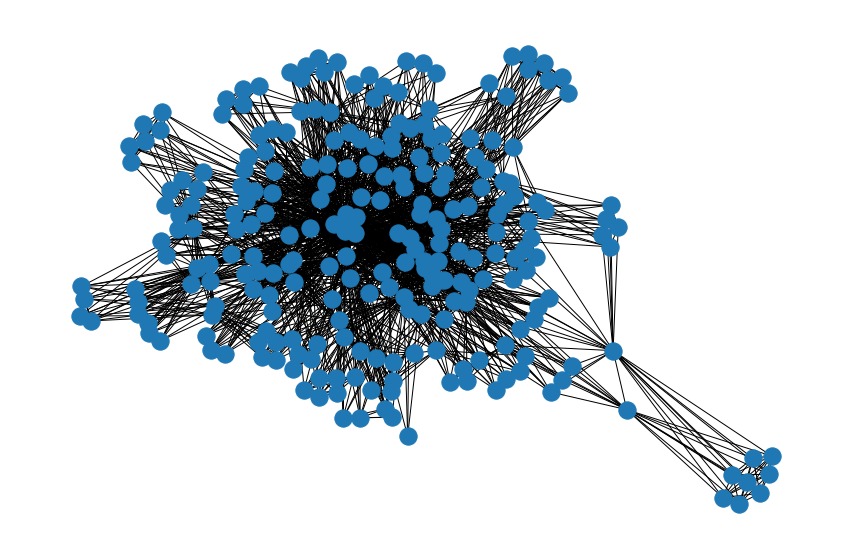

In [129]:
#Plotting the graph
G = nx.Graph()
plt.figure(3,figsize=(15,10)) 
plt.tight_layout()
plt.axis("off")
nx.draw(network)


In [130]:
  #printing all values which are generated using library funcions
  print("Nodes ",network.number_of_nodes() ) #for Nodes
  print("Edges ",network.number_of_edges() ) #for Edges
  print("network information", network) #For Network Information
  print('Degree', network.degree()) #for Degree
  print("weighted degree", network.degree(weight='weight')) #for Weights


Nodes  248
Edges  2141
network information Graph with 248 nodes and 2141 edges
Degree [(0, 10), (1, 18), (2, 24), (3, 31), (4, 19), (5, 9), (6, 10), (7, 49), (8, 90), (9, 62), (10, 14), (11, 16), (12, 20), (13, 42), (14, 14), (15, 16), (16, 102), (17, 18), (18, 32), (19, 11), (20, 93), (21, 24), (22, 9), (23, 166), (24, 26), (25, 31), (26, 55), (27, 9), (28, 31), (29, 9), (30, 17), (31, 9), (32, 35), (33, 48), (34, 15), (35, 26), (36, 11), (37, 19), (38, 11), (39, 11), (40, 66), (41, 29), (42, 16), (43, 17), (44, 11), (45, 32), (46, 10), (47, 64), (48, 16), (49, 10), (50, 25), (51, 23), (52, 9), (53, 17), (54, 11), (55, 18), (56, 20), (57, 9), (58, 9), (59, 9), (60, 9), (61, 9), (62, 46), (63, 9), (64, 9), (65, 7), (66, 9), (67, 28), (68, 11), (69, 37), (70, 11), (71, 9), (72, 9), (73, 11), (74, 9), (75, 10), (76, 9), (77, 10), (78, 10), (79, 17), (80, 9), (81, 29), (82, 10), (83, 37), (84, 10), (85, 9), (86, 16), (87, 9), (88, 66), (89, 10), (90, 9), (91, 9), (92, 9), (93, 9), (94, 17

In [131]:
#Calculation of Degree block
def degree(data): #function defination
  df_degree = pd.DataFrame(data, columns=['Nodes', 'Degree'])
  df_degree['Keywords'] = unique_list
  return df_degree

In [132]:
#Calculation of Strength Block
def strength(data): #Strength Block
  df_strength = pd.DataFrame(data, columns=['Nodes', 'Strength'])
  df_strength['Keywords'] = unique_list
  return df_strength

In [133]:
#Calculation of Weights Block
def weights(df_strength, matrix_passed): #Weight Function
  lister = []
  for i in range(0,248):
    for j in range(0,248):
      lister.append([df_strength['Keywords'][i], df_strength['Keywords'][j], matrix_passed[i][j]])
  df122 = pd.DataFrame(lister, columns =['keyword-1', 'keyword-2', 'weight'], dtype = float) 
  return df122

In [134]:
df1 =  degree(network.degree) #Degree Calculation function call
df2=df1.sort_values(by = ['Degree'], ascending= False).head(10) #sorting in ascending order and printing only top 10 values
df2.style.hide_index()

Nodes,Degree,Keywords
23,166,organizational behavior
112,104,organizational effectiveness
16,102,management science
20,93,personnel management
8,90,decision making
156,74,organizational structure
40,66,organizational sociology
88,66,strategic planning
47,64,industrial management
9,62,corporate governance


In [135]:
df_str = strength(network.degree(weight='weight')) #Strength calculation function call
df3= df_str.sort_values(by = ['Strength'], ascending= False).head(10) #sorting in ascending order and printing only top 10 values
df3.style.hide_index()

Nodes,Strength,Keywords
23,265,organizational behavior
112,144,organizational effectiveness
16,136,management science
20,126,personnel management
8,112,decision making
156,107,organizational structure
40,96,organizational sociology
9,85,corporate governance
47,84,industrial management
88,80,strategic planning


In [136]:
dfw= weights(df_str, Zero_Matrix) #Weight calculation function call
df4= dfw.sort_values(by = ['weight'], ascending= False).head(10) #sorting in ascending order and printing only top 10 values
df4.style.hide_index()

<ipython-input-136-94f65636aa98>:1: FutureWarning: Could not cast to float64, falling back to object. This behavior is deprecated. In a future version, when a dtype is passed to 'DataFrame', either all columns will be cast to that dtype, or a TypeError will be raised
  dfw= weights(df_str, Zero_Matrix) #Weight calculation function call


keyword-1,keyword-2,weight
organizational behavior,organizational effectiveness,11.000000
organizational effectiveness,organizational behavior,11.000000
organizational behavior,organizational structure,9.000000
organizational structure,organizational behavior,9.000000
organizational behavior,personnel management,8.000000
personnel management,organizational behavior,8.000000
management science,organizational behavior,7.000000
organizational behavior,management science,7.000000
decision making,organizational behavior,6.000000
organizational behavior,organizational sociology,6.000000


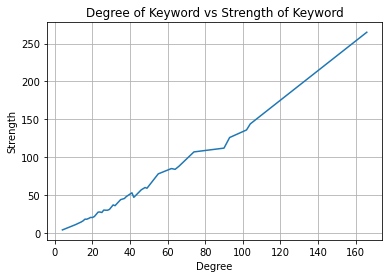

In [137]:
#Plotting a line graph of average between degree and strength
plotdf = pd.merge(df1,df_str,how="inner",on=['Nodes'])
plotdf = plotdf[['Degree','Strength']].groupby('Degree').mean().reset_index()
plt.plot(plotdf['Degree'], plotdf['Strength'])
plt.xlabel('Degree')
plt.ylabel('Strength')
plt.title('Degree of Keyword vs Strength of Keyword')
plt.grid(True)

# TASK 2

In [139]:
#Importing Files 
from google.colab import files
uploaded = files.upload()

Saving 2017.csv to 2017 (1).csv
Saving 2018.csv to 2018 (1).csv
Saving 2019.csv to 2019 (1).csv
Saving 2020.csv to 2020 (1).csv
Saving 2021.csv to 2021 (1).csv
Saving 2022.csv to 2022 (1).csv


In [140]:
# Combining the tweeted data and removing the unwanted charcters from the sentence 
def combining(datas): #Combing Functon Defination
  Tweeter=' '.join(datas['tweet']) #Joining
  Tweeter=Tweeter.lower() #Converting to lower case
  Tweeter=' '.join([word for word in Tweeter.split() if word not in (stopwords.words('english'))]) #Stop Word excluding from gthe sentence
  Tweeter=re.sub(r'[^\w\s]','',Tweeter) #sub String 
  return Tweeter #return Function

In [141]:
#Spliting Paragraphs into Single words
def tokenizing(input): #Tokenizing Function
  tokens=nltk.tokenize.word_tokenize(tweet)
  print(list(nltk.bigrams(tokens)))
  return nltk.bigrams(tokens)

In [142]:
# Frequency/occurance of each word
def frequency(input): #Frequency Function defination
  Words=input.split() #Spliting function
  Words=Counter(Words).most_common()
  input=pd.DataFrame(Words,columns=['Word','Frequency'])
  return input

In [143]:
#function to vizualize log-log plot
def Log_Plot(dataff): #Log Plot visualisation block
  plt.title('Log plot')
  plt.loglog(dataff['Frequency'],dataff['rank'])
  plt.show() #Show graph

In [156]:
#Rank adding function to the data frame
def frquency_rank(dataframe): #Defination
  dataframe['rank']=range(1,len(dataframe)+1)
  return dataframe

In [145]:
def bigram_network_plot(datainput): #Bigram graph network function
  G=nx.Graph()
  for da in ((datainput)):
    G.add_edge(da[0],da[1])
  plt.figure(3,figsize=(10,10))   
  plt.tight_layout()    
  plt.axis("off")
  nx.draw(G)
  plt.show()

### Tweet Year 2017

In [146]:
#Data Reading For 2017 Year
dataf17 = pd.read_csv('2017.csv')
dataf17

,Unnamed: 0,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,0,945814723521417217,945712432416137217,1.514335e+12,2017-12-27 00:32:57,0,NaN,@neilsiegel @Tesla Coming very soon,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'neilsiegel', 'name': 'Neil S...",NaN,NaN,NaN,NaN
1,1,945749747129659392,945712432416137217,1.514319e+12,2017-12-26 20:14:45,0,NaN,@Kreative Vastly better maps/nav coming soon,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Kreative', 'name': 'Leslie',...",NaN,NaN,NaN,NaN
2,2,945748731197980672,945712432416137217,1.514319e+12,2017-12-26 20:10:43,0,NaN,@dd_hogan Ok,und,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'dd_hogan', 'name': 'Live4EVD...",NaN,NaN,NaN,NaN
3,3,945730195113365504,945727773493968896,1.514315e+12,2017-12-26 18:57:03,0,NaN,@Jason @Tesla Sure,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Jason', 'name': 'jason@calac...",NaN,NaN,NaN,NaN
4,4,945729852874694656,945712432416137217,1.514315e+12,2017-12-26 18:55:42,0,NaN,"@kabirakhtar Yeah, it’s terrible. Had to upgra...",en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'kabirakhtar', 'name': 'kabir...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3162,3162,142881284019060736,142881284019060736,1.322901e+12,2011-12-03 08:22:07,0,NaN,That was a total non sequitur btw,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3163,3163,142880871391838208,142880871391838208,1.322900e+12,2011-12-03 08:20:28,0,NaN,"Great Voltaire quote, arguably better than Twa...",en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3164,3164,142188458125963264,142188458125963264,1.322735e+12,2011-12-01 10:29:04,0,NaN,I made the volume on the Model S http://t.co/...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3165,3165,142179928203460608,142179928203460608,1.322733e+12,2011-12-01 09:55:11,0,NaN,Went to Iceland on Sat to ride bumper cars on ...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [147]:
dataf17.head() #Displaying dataframe

,Unnamed: 0,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,0,945814723521417217,945712432416137217,1.514335e+12,2017-12-27 00:32:57,0,NaN,@neilsiegel @Tesla Coming very soon,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'neilsiegel', 'name': 'Neil S...",NaN,NaN,NaN,NaN
1,1,945749747129659392,945712432416137217,1.514319e+12,2017-12-26 20:14:45,0,NaN,@Kreative Vastly better maps/nav coming soon,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Kreative', 'name': 'Leslie',...",NaN,NaN,NaN,NaN
2,2,945748731197980672,945712432416137217,1.514319e+12,2017-12-26 20:10:43,0,NaN,@dd_hogan Ok,und,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'dd_hogan', 'name': 'Live4EVD...",NaN,NaN,NaN,NaN
3,3,945730195113365504,945727773493968896,1.514315e+12,2017-12-26 18:57:03,0,NaN,@Jason @Tesla Sure,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Jason', 'name': 'jason@calac...",NaN,NaN,NaN,NaN
4,4,945729852874694656,945712432416137217,1.514315e+12,2017-12-26 18:55:42,0,NaN,"@kabirakhtar Yeah, it’s terrible. Had to upgra...",en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'kabirakhtar', 'name': 'kabir...",NaN,NaN,NaN,NaN


In [148]:
tweet=combining(dataf17) #Calling the combining function

In [149]:
tokenizing(tweet) #Calling the Tokenizing Function

[('neilsiegel', 'tesla'), ('tesla', 'coming'), ('coming', 'soon'), ('soon', 'kreative'), ('kreative', 'vastly'), ('vastly', 'better'), ('better', 'mapsnav'), ('mapsnav', 'coming'), ('coming', 'soon'), ('soon', 'dd_hogan'), ('dd_hogan', 'ok'), ('ok', 'jason'), ('jason', 'tesla'), ('tesla', 'sure'), ('sure', 'kabirakhtar'), ('kabirakhtar', 'yeah'), ('yeah', 'its'), ('its', 'terrible'), ('terrible', 'upgrade'), ('upgrade', 'old'), ('old', 'linux'), ('linux', 'os'), ('os', 'bunch'), ('bunch', 'drivers'), ('drivers', 'first'), ('first', 'major'), ('major', 'browser'), ('browser', 'upgrades'), ('upgrades', 'coming'), ('coming', 'cars'), ('cars', 'months'), ('months', 'note'), ('note', 'slower'), ('slower', 'first'), ('first', 'code'), ('code', 'optimized'), ('optimized', 'sustainableanna'), ('sustainableanna', 'vanseedbank'), ('vanseedbank', 'similar'), ('similar', 'total'), ('total', 'size'), ('size', 'maybe'), ('maybe', 'slightly'), ('slightly', 'bigger'), ('bigger', 'account'), ('account'

<generator object bigrams at 0x7f17b76c8b30>

In [150]:
# THE most used words in the tweets of Elon Musk
datafrequently17 = frequency(tweet)
df17= datafrequently17.head(10)
datafrequently17.head(10)

,Word,Frequency
0,tesla,305
1,amp,212
2,model,208
3,good,171
4,rocket,149
5,like,137
6,yes,132
7,spacex,124
8,launch,112
9,next,103


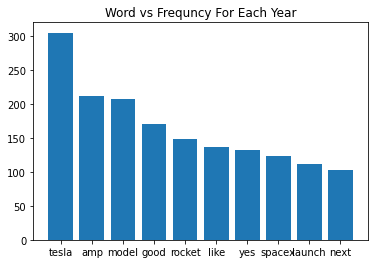

<Figure size 1440x1440 with 0 Axes>

In [151]:
#Plotting a histogram
plt.bar(df17['Word'],df17['Frequency'])
plt.title('Word vs Frequncy For Each Year')
plt.figure(figsize=(20,20)) 
plt.show()

[('neilsiegel', 'tesla'), ('tesla', 'coming'), ('coming', 'soon'), ('soon', 'kreative'), ('kreative', 'vastly'), ('vastly', 'better'), ('better', 'mapsnav'), ('mapsnav', 'coming'), ('coming', 'soon'), ('soon', 'dd_hogan'), ('dd_hogan', 'ok'), ('ok', 'jason'), ('jason', 'tesla'), ('tesla', 'sure'), ('sure', 'kabirakhtar'), ('kabirakhtar', 'yeah'), ('yeah', 'its'), ('its', 'terrible'), ('terrible', 'upgrade'), ('upgrade', 'old'), ('old', 'linux'), ('linux', 'os'), ('os', 'bunch'), ('bunch', 'drivers'), ('drivers', 'first'), ('first', 'major'), ('major', 'browser'), ('browser', 'upgrades'), ('upgrades', 'coming'), ('coming', 'cars'), ('cars', 'months'), ('months', 'note'), ('note', 'slower'), ('slower', 'first'), ('first', 'code'), ('code', 'optimized'), ('optimized', 'sustainableanna'), ('sustainableanna', 'vanseedbank'), ('vanseedbank', 'similar'), ('similar', 'total'), ('total', 'size'), ('size', 'maybe'), ('maybe', 'slightly'), ('slightly', 'bigger'), ('bigger', 'account'), ('account'

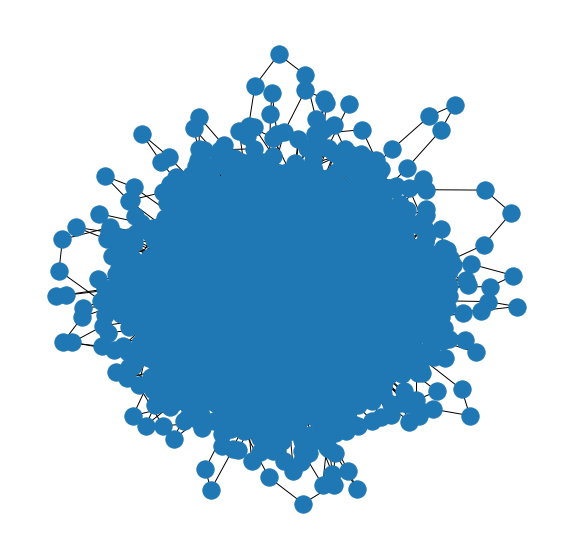

In [152]:
#Plotting a bigram graph network
bigram_network_plot(tokenizing(tweet))

In [157]:
#Calling the frequency rank function
frquency_rank(datafrequently17)

,Word,Frequency,rank
0,tesla,305,1
1,amp,212,2
2,model,208,3
3,good,171,4
4,rocket,149,5
...,...,...,...
8800,rink,1,8801
8801,nuys,1,8802
8802,httptcorbqxj9it,1,8803
8803,ignore,1,8804


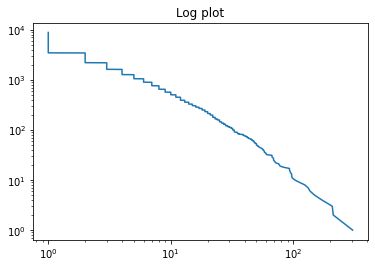

In [158]:
#Plotting the LOGLOG Plot
Log_Plot(frquency_rank(datafrequently17))

## TWEET YEAR 2018

In [159]:
#Data Reading For 2018 Year
dataf18=pd.read_csv('2018.csv')
dataf18

,Unnamed: 0,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,0,1079469237230493696,1079155749077475328,1.546200e+12,2018-12-30 20:08:16,0,NaN,@Ben757677 @vincent13031925 Thanks Tesla owner...,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'vincent13031925', 'name': 'V...",NaN,NaN,NaN,NaN
1,1,1079459047252709377,1079457030060924928,1.546198e+12,2018-12-30 19:27:46,0,NaN,"@Grimezsz Turns out if you take Dayquil, you e...",en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Grimezsz', 'name': '☾laire d...",NaN,NaN,NaN,NaN
2,2,1078716366591483904,1078716366591483904,1.546021e+12,2018-12-28 18:16:38,0,NaN,Excited to have Larry Ellison &amp; Kathleen W...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,3,1078529476018008064,1078529330492321793,1.545976e+12,2018-12-28 05:53:59,0,NaN,@NutmegTheRed @Tesla Ok,und,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Tesla', 'name': 'Tesla', 'id...",NaN,NaN,NaN,NaN
4,4,1078395092090699776,1078383289356902401,1.545944e+12,2018-12-27 21:00:00,0,NaN,@westcoastbill Tesla team did a great job!,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'westcoastbill', 'name': 'bil...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2280,2280,949831212326993920,949831212326993920,1.515292e+12,2018-01-07 02:33:02,0,NaN,"Gonna put an old school drive-in, roller skate...",en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2281,2281,949075535459528705,949075475036487680,1.515112e+12,2018-01-05 00:30:15,0,NaN,https://t.co/3k71xzDIP1,und,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2282,2282,949075475036487680,949075475036487680,1.515112e+12,2018-01-05 00:30:00,0,NaN,Falcon Heavy goes vertical https://t.co/uG1k0...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2283,2283,948469610944241664,948469610944241664,1.514968e+12,2018-01-03 08:22:31,0,NaN,Using a neural net to detect rain using camera...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [160]:
#Calling the combining function
tweet=combining(dataf18)

In [161]:
#Calling the Tokenizing Function
tokenizing(tweet)


[('ben757677', 'vincent13031925'), ('vincent13031925', 'thanks'), ('thanks', 'tesla'), ('tesla', 'owners'), ('owners', 'china'), ('china', 'looking'), ('looking', 'forward'), ('forward', 'visiting'), ('visiting', 'soon'), ('soon', 'groundbreaking'), ('groundbreaking', 'gigafactory'), ('gigafactory', 'shanghai'), ('shanghai', 'grimezsz'), ('grimezsz', 'turns'), ('turns', 'take'), ('take', 'dayquil'), ('dayquil', 'exit'), ('exit', 'matrix'), ('matrix', 'excited'), ('excited', 'larry'), ('larry', 'ellison'), ('ellison', 'amp'), ('amp', 'kathleen'), ('kathleen', 'wilsonthompson'), ('wilsonthompson', 'join'), ('join', 'tesla'), ('tesla', 'board'), ('board', 'httpstcocqyvkgscst'), ('httpstcocqyvkgscst', 'nutmegthered'), ('nutmegthered', 'tesla'), ('tesla', 'ok'), ('ok', 'westcoastbill'), ('westcoastbill', 'tesla'), ('tesla', 'team'), ('team', 'great'), ('great', 'job'), ('job', 'teslaownerssv'), ('teslaownerssv', 'alexraikos'), ('alexraikos', '2020'), ('2020', 'alexraikos'), ('alexraikos', '

<generator object bigrams at 0x7f17bafcb820>

In [162]:
# THE most used words in the tweets of Elon Musk
datafrequently18 = frequency(tweet)
df18= datafrequently18.head(10)
datafrequently18.head(10)

,Word,Frequency
0,amp,524
1,tesla,447
2,car,119
3,yes,107
4,3,102
5,good,102
6,model,98
7,its,95
8,like,94
9,spacex,88


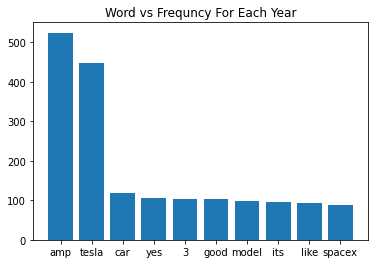

<Figure size 1440x1440 with 0 Axes>

In [163]:
#Plotting a histogram
plt.bar(df18['Word'],df18['Frequency'])
plt.title('Word vs Frequncy For Each Year')
plt.figure(figsize=(20,20)) 
plt.show()

[('ben757677', 'vincent13031925'), ('vincent13031925', 'thanks'), ('thanks', 'tesla'), ('tesla', 'owners'), ('owners', 'china'), ('china', 'looking'), ('looking', 'forward'), ('forward', 'visiting'), ('visiting', 'soon'), ('soon', 'groundbreaking'), ('groundbreaking', 'gigafactory'), ('gigafactory', 'shanghai'), ('shanghai', 'grimezsz'), ('grimezsz', 'turns'), ('turns', 'take'), ('take', 'dayquil'), ('dayquil', 'exit'), ('exit', 'matrix'), ('matrix', 'excited'), ('excited', 'larry'), ('larry', 'ellison'), ('ellison', 'amp'), ('amp', 'kathleen'), ('kathleen', 'wilsonthompson'), ('wilsonthompson', 'join'), ('join', 'tesla'), ('tesla', 'board'), ('board', 'httpstcocqyvkgscst'), ('httpstcocqyvkgscst', 'nutmegthered'), ('nutmegthered', 'tesla'), ('tesla', 'ok'), ('ok', 'westcoastbill'), ('westcoastbill', 'tesla'), ('tesla', 'team'), ('team', 'great'), ('great', 'job'), ('job', 'teslaownerssv'), ('teslaownerssv', 'alexraikos'), ('alexraikos', '2020'), ('2020', 'alexraikos'), ('alexraikos', '

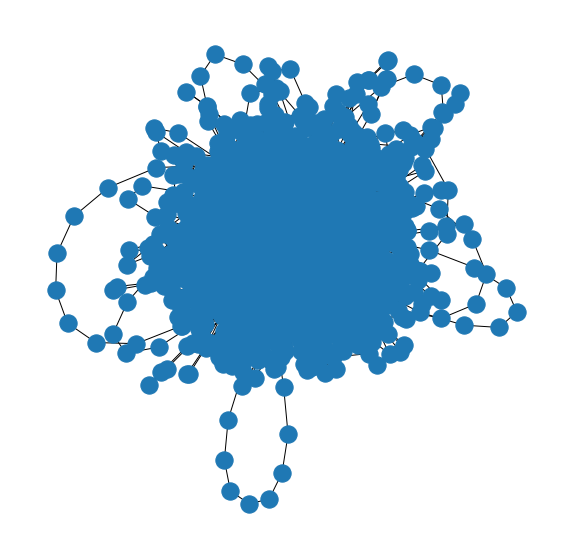

In [164]:
#Plotting a bigram graph network
bigram_network_plot(tokenizing(tweet))

In [165]:
#Calling the frequency rank function
frquency_rank(datafrequently18)

,Word,Frequency,rank
0,amp,524,1
1,tesla,447,2
2,car,119,3
3,yes,107,4
4,3,102,5
...,...,...,...
7302,httpstcoym0tq6vlov,1,7303
7303,river,1,7304
7304,sierra,1,7305
7305,roaming,1,7306


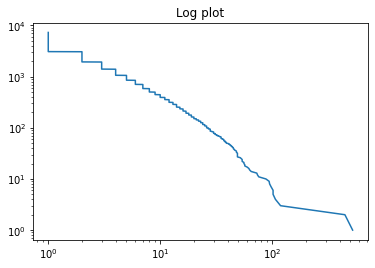

In [166]:
#Plotting the LOGLOG Plot
Log_Plot(frquency_rank(datafrequently18))

## TWEET YEAR 2019

In [167]:
#Data Reading For 2019 Year
dataf19=pd.read_csv('2019.csv')
dataf19.head()

,Unnamed: 0,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,0,1211071324518531072,1210918835861241856,1.577577e+12,2019-12-28 23:47:59,0,NaN,@Joe__Wakefield @austinbarnard45 @tjq1190 @tyg...,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'austinbarnard45', 'name': 'A...",NaN,NaN,NaN,NaN
1,1,1211069054779301894,1210918835861241856,1.577576e+12,2019-12-28 23:38:57,0,NaN,@austinbarnard45 @tjq1190 @tyger_cyber @fawful...,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'austinbarnard45', 'name': 'A...",NaN,NaN,NaN,NaN
2,2,1211064937004589056,1210918835861241856,1.577575e+12,2019-12-28 23:22:36,0,NaN,@IrinaAntony @tjq1190 @tyger_cyber @fawfulfan ...,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'IrinaAntony', 'name': '✨⭐️✨'...",NaN,NaN,NaN,NaN
3,3,1211054942192119808,1210918835861241856,1.577573e+12,2019-12-28 22:42:53,0,NaN,@tjq1190 @tyger_cyber @fawfulfan @_Mikemo He d...,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'tjq1190', 'name': 'Tyler J. ...",NaN,NaN,NaN,NaN
4,4,1211051740562366464,1210774027054145536,1.577572e+12,2019-12-28 22:30:09,0,NaN,@geofficient Pretty much,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'geofficient', 'name': 'Geoff...",NaN,NaN,NaN,NaN


In [168]:
#Calling the combining function
tweet=combining(dataf19)

In [169]:
#Calling the Tokenizing Function
tokenizing(tweet)

[('joe__wakefield', 'austinbarnard45'), ('austinbarnard45', 'tjq1190'), ('tjq1190', 'tyger_cyber'), ('tyger_cyber', 'fawfulfan'), ('fawfulfan', '_mikemo'), ('_mikemo', 'pretty'), ('pretty', 'awful'), ('awful', 'lie'), ('lie', 'left'), ('left', 'south'), ('south', 'africa'), ('africa', '17'), ('17', 'backpack'), ('backpack', 'amp'), ('amp', 'suitcase'), ('suitcase', 'books'), ('books', 'worked'), ('worked', 'moms'), ('moms', 'cousins'), ('cousins', 'farm'), ('farm', 'saskatchewan'), ('saskatchewan', 'amp'), ('amp', 'lumber'), ('lumber', 'mill'), ('mill', 'vancouver'), ('vancouver', 'went'), ('went', 'queens'), ('queens', 'univ'), ('univ', 'scholarship'), ('scholarship', 'amp'), ('amp', 'debt'), ('debt', 'upennwharton'), ('upennwharton', 'amp'), ('amp', 'stanford'), ('stanford', 'austinbarnard45'), ('austinbarnard45', 'tjq1190'), ('tjq1190', 'tyger_cyber'), ('tyger_cyber', 'fawfulfan'), ('fawfulfan', '_mikemo'), ('_mikemo', 'person'), ('person', 'blocked'), ('blocked', 'me'), ('me', 'can

<generator object bigrams at 0x7f17c6d21890>

In [170]:
# THE most used words in the tweets of Elon Musk
datafrequently19 = frequency(tweet)
df19= datafrequently19.head(10)
datafrequently19.head(10)

,Word,Frequency
0,tesla,1310
1,amp,1204
2,spacex,425
3,yes,392
4,model,373
5,good,358
6,like,314
7,erdayastronaut,300
8,car,282
9,would,270


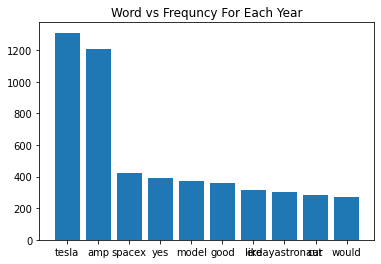

<Figure size 1440x1440 with 0 Axes>

In [171]:
#Plotting a histogram
plt.bar(df19['Word'],df19['Frequency'])
plt.title('Word vs Frequncy For Each Year')
plt.figure(figsize=(20,20)) 
plt.show()

[('joe__wakefield', 'austinbarnard45'), ('austinbarnard45', 'tjq1190'), ('tjq1190', 'tyger_cyber'), ('tyger_cyber', 'fawfulfan'), ('fawfulfan', '_mikemo'), ('_mikemo', 'pretty'), ('pretty', 'awful'), ('awful', 'lie'), ('lie', 'left'), ('left', 'south'), ('south', 'africa'), ('africa', '17'), ('17', 'backpack'), ('backpack', 'amp'), ('amp', 'suitcase'), ('suitcase', 'books'), ('books', 'worked'), ('worked', 'moms'), ('moms', 'cousins'), ('cousins', 'farm'), ('farm', 'saskatchewan'), ('saskatchewan', 'amp'), ('amp', 'lumber'), ('lumber', 'mill'), ('mill', 'vancouver'), ('vancouver', 'went'), ('went', 'queens'), ('queens', 'univ'), ('univ', 'scholarship'), ('scholarship', 'amp'), ('amp', 'debt'), ('debt', 'upennwharton'), ('upennwharton', 'amp'), ('amp', 'stanford'), ('stanford', 'austinbarnard45'), ('austinbarnard45', 'tjq1190'), ('tjq1190', 'tyger_cyber'), ('tyger_cyber', 'fawfulfan'), ('fawfulfan', '_mikemo'), ('_mikemo', 'person'), ('person', 'blocked'), ('blocked', 'me'), ('me', 'can

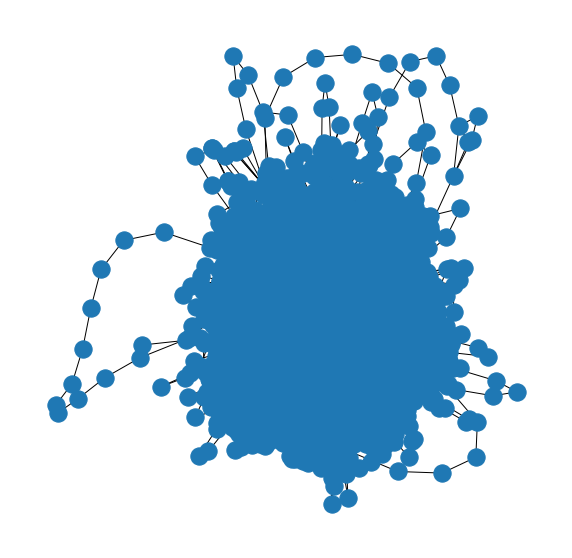

In [172]:
#Plotting a bigram graph network
bigram_network_plot(tokenizing(tweet))

In [173]:
#Calling the frequency rank function
frquency_rank(datafrequently19)

,Word,Frequency,rank
0,tesla,1310,1
1,amp,1204,2
2,spacex,425,3
3,yes,392,4
4,model,373,5
...,...,...,...
16128,stonehenge,1,16129
16129,vlads,1,16130
16130,rink,1,16131
16131,nuys,1,16132


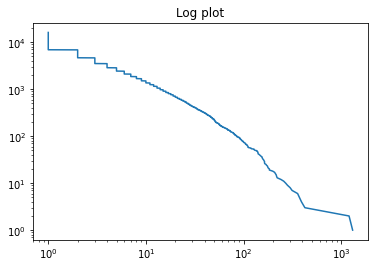

In [174]:
#Plotting the LOGLOG Plot
Log_Plot(frquency_rank(datafrequently19))

## TWEET YEAR 2020

In [175]:
#Data Reading For 2020 Year
dataf20=pd.read_csv('2020.csv')
dataf20.head()

,Unnamed: 0,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,0,1343644462036086785,1343320495127633920,1.609185e+12,2020-12-28 19:46:18,0,NaN,Entertainment will be critical when cars drive...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1,1343619610617077760,1343386617294295040,1.609179e+12,2020-12-28 18:07:33,0,NaN,@kimpaquette Just meeting with Larry Ellison t...,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'kimpaquette', 'name': 'Kim P...",NaN,NaN,NaN,NaN
2,2,1343608616960491521,1343576442722893825,1.609176e+12,2020-12-28 17:23:51,0,NaN,@richierichhhhh_ Absolutely,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'richierichhhhh_', 'name': 'R...",NaN,NaN,NaN,NaN
3,3,1343608530998153222,1343320495127633920,1.609176e+12,2020-12-28 17:23:31,0,NaN,What should Tesla do with in-car gaming in an ...,en,[],...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,4,1343431408052662273,1343043963096326147,1.609134e+12,2020-12-28 05:39:42,0,NaN,@PPathole @WSJ Absolutely,en,[],...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'PPathole', 'name': 'Pranay P...",NaN,NaN,NaN,NaN


In [176]:
tweet=combining(dataf20) #Calling the combining function
tokenizing(tweet) #Calling the Tokenizing Function

[('entertainment', 'critical'), ('critical', 'cars'), ('cars', 'drive'), ('drive', 'kimpaquette'), ('kimpaquette', 'meeting'), ('meeting', 'larry'), ('larry', 'ellison'), ('ellison', 'seek'), ('seek', 'advice'), ('advice', 'back'), ('back', 'working'), ('working', 'tesla'), ('tesla', 'end'), ('end', 'quarter'), ('quarter', 'tomorrow'), ('tomorrow', 'richierichhhhh_'), ('richierichhhhh_', 'absolutely'), ('absolutely', 'tesla'), ('tesla', 'incar'), ('incar', 'gaming'), ('gaming', 'autonomous'), ('autonomous', 'world'), ('world', 'ppathole'), ('ppathole', 'wsj'), ('wsj', 'absolutely'), ('absolutely', 'tesmanian_com'), ('tesmanian_com', 'taste'), ('taste', 'future'), ('future', 'try'), ('try', 'playing'), ('playing', 'polytopia'), ('polytopia', 'tesla'), ('tesla', 'great'), ('great', 'game'), ('game', 'multiplayer'), ('multiplayer', 'online'), ('online', 'version'), ('version', 'coming'), ('coming', 'soon'), ('soon', 'wsj'), ('wsj', 'focus'), ('focus', 'making'), ('making', 'products'), ('

<generator object bigrams at 0x7f17c2bccc10>

In [177]:
# THE most used words in the tweets of Elon Musk
datafrequently20 = frequency(tweet)
df20= datafrequently20.head(10)
datafrequently20.head(10)

,Word,Frequency
0,amp,1804
1,tesla,1673
2,spacex,632
3,erdayastronaut,561
4,yes,553
5,good,471
6,flcnhvy,424
7,model,403
8,like,392
9,great,370


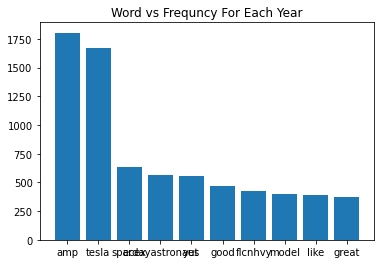

<Figure size 1440x1440 with 0 Axes>

In [178]:
#Plotting a histogram
plt.bar(df20['Word'],df20['Frequency'])
plt.title('Word vs Frequncy For Each Year')
plt.figure(figsize=(20,20)) 
plt.show()

[('entertainment', 'critical'), ('critical', 'cars'), ('cars', 'drive'), ('drive', 'kimpaquette'), ('kimpaquette', 'meeting'), ('meeting', 'larry'), ('larry', 'ellison'), ('ellison', 'seek'), ('seek', 'advice'), ('advice', 'back'), ('back', 'working'), ('working', 'tesla'), ('tesla', 'end'), ('end', 'quarter'), ('quarter', 'tomorrow'), ('tomorrow', 'richierichhhhh_'), ('richierichhhhh_', 'absolutely'), ('absolutely', 'tesla'), ('tesla', 'incar'), ('incar', 'gaming'), ('gaming', 'autonomous'), ('autonomous', 'world'), ('world', 'ppathole'), ('ppathole', 'wsj'), ('wsj', 'absolutely'), ('absolutely', 'tesmanian_com'), ('tesmanian_com', 'taste'), ('taste', 'future'), ('future', 'try'), ('try', 'playing'), ('playing', 'polytopia'), ('polytopia', 'tesla'), ('tesla', 'great'), ('great', 'game'), ('game', 'multiplayer'), ('multiplayer', 'online'), ('online', 'version'), ('version', 'coming'), ('coming', 'soon'), ('soon', 'wsj'), ('wsj', 'focus'), ('focus', 'making'), ('making', 'products'), ('

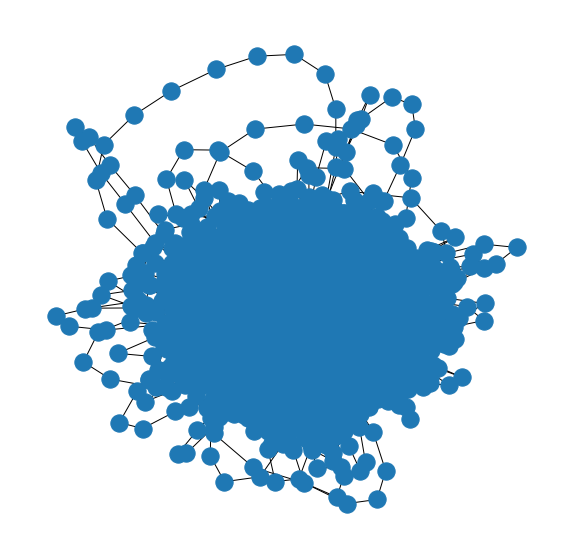

In [179]:
#Plotting a bigram graph network
bigram_network_plot(tokenizing(tweet))

In [180]:
#Calling the frequency rank function
frquency_rank(datafrequently20)

,Word,Frequency,rank
0,amp,1804,1
1,tesla,1673,2
2,spacex,632,3
3,erdayastronaut,561,4
4,yes,553,5
...,...,...,...
19524,stonehenge,1,19525
19525,vlads,1,19526
19526,rink,1,19527
19527,nuys,1,19528


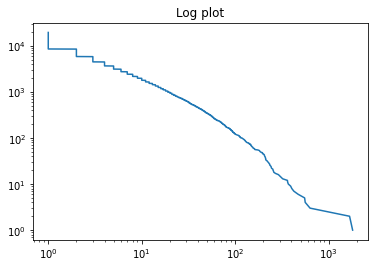

In [181]:
#Plotting the LOGLOG Plot
Log_Plot(frquency_rank(datafrequently20))

## TWEET YEAR 2021

In [182]:
#Data Reading For 2021 Year
dataf21=pd.read_csv('2021.csv')
dataf21.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1476662222617251846,1476620230692679680,2021-12-31 01:11:23 Arabian Standard Time,2021-12-31,01:11:23,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'roshanpateI', 'name': 'Rosha...",NaN,NaN,NaN,NaN
1,1476656306610216960,1476644467578859528,2021-12-31 00:47:53 Arabian Standard Time,2021-12-31,00:47:53,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'tesla_raj', 'name': 'Tesla R...",NaN,NaN,NaN,NaN
2,1476651519986614281,1476252898115964928,2021-12-31 00:28:51 Arabian Standard Time,2021-12-31,00:28:51,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'CSmithson80', 'name': 'Chris...",NaN,NaN,NaN,NaN
3,1476619907076923398,1476252898115964928,2021-12-30 22:23:14 Arabian Standard Time,2021-12-30,22:23:14,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'BLKMDL3', 'name': 'Zack', 'i...",NaN,NaN,NaN,NaN
4,1476618021024190474,1476252898115964928,2021-12-30 22:15:45 Arabian Standard Time,2021-12-30,22:15:45,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'mims', 'name': 'Christopher ...",NaN,NaN,NaN,NaN


In [183]:
tweet=combining(dataf17)  #Calling the combining function
tokenizing(tweet)  #Calling the Tokenizing Function

[('neilsiegel', 'tesla'), ('tesla', 'coming'), ('coming', 'soon'), ('soon', 'kreative'), ('kreative', 'vastly'), ('vastly', 'better'), ('better', 'mapsnav'), ('mapsnav', 'coming'), ('coming', 'soon'), ('soon', 'dd_hogan'), ('dd_hogan', 'ok'), ('ok', 'jason'), ('jason', 'tesla'), ('tesla', 'sure'), ('sure', 'kabirakhtar'), ('kabirakhtar', 'yeah'), ('yeah', 'its'), ('its', 'terrible'), ('terrible', 'upgrade'), ('upgrade', 'old'), ('old', 'linux'), ('linux', 'os'), ('os', 'bunch'), ('bunch', 'drivers'), ('drivers', 'first'), ('first', 'major'), ('major', 'browser'), ('browser', 'upgrades'), ('upgrades', 'coming'), ('coming', 'cars'), ('cars', 'months'), ('months', 'note'), ('note', 'slower'), ('slower', 'first'), ('first', 'code'), ('code', 'optimized'), ('optimized', 'sustainableanna'), ('sustainableanna', 'vanseedbank'), ('vanseedbank', 'similar'), ('similar', 'total'), ('total', 'size'), ('size', 'maybe'), ('maybe', 'slightly'), ('slightly', 'bigger'), ('bigger', 'account'), ('account'

<generator object bigrams at 0x7f17bf151c80>

In [184]:
# THE most used words in the tweets of Elon Musk
datafrequently21 = frequency(tweet)
df21= datafrequently21.head(10)
datafrequently21.head(10)


,Word,Frequency
0,tesla,305
1,amp,212
2,model,208
3,good,171
4,rocket,149
5,like,137
6,yes,132
7,spacex,124
8,launch,112
9,next,103


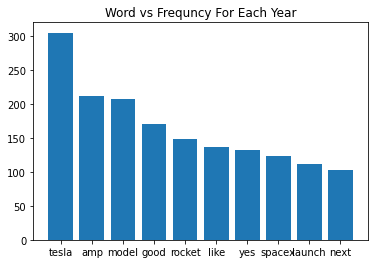

<Figure size 1440x1440 with 0 Axes>

In [185]:
#Plotting a histogram
plt.bar(df21['Word'],df21['Frequency']) 
plt.title('Word vs Frequncy For Each Year')
plt.figure(figsize=(20,20)) 
plt.show()

[('spacepadreisle', 'way'), ('way', 'free'), ('free', 'qa'), ('qa', 'haha'), ('haha', 'teslaownerssv'), ('teslaownerssv', 'beautiful'), ('beautiful', 'home'), ('home', 'life'), ('life', 'spacepadreisle'), ('spacepadreisle', 'starlink'), ('starlink', 'terminals'), ('terminals', 'near'), ('near', 'conflict'), ('conflict', 'areas'), ('areas', 'jammed'), ('jammed', 'several'), ('several', 'hours'), ('hours', 'time'), ('time', 'latest'), ('latest', 'software'), ('software', 'update'), ('update', 'bypasses'), ('bypasses', 'jamming'), ('jamming', 'curious'), ('curious', 'see'), ('see', 'whats'), ('whats', 'next'), ('next', 'rationaletienne'), ('rationaletienne', 'rogeryar'), ('rogeryar', 'exactly'), ('exactly', 'rogeryar'), ('rogeryar', 'news'), ('news', 'sources'), ('sources', 'partially'), ('partially', 'propaganda'), ('propaganda', 'others'), ('others', 'starlink'), ('starlink', 'told'), ('told', 'governments'), ('governments', 'not'), ('not', 'ukraine'), ('ukraine', 'block'), ('block', 'r

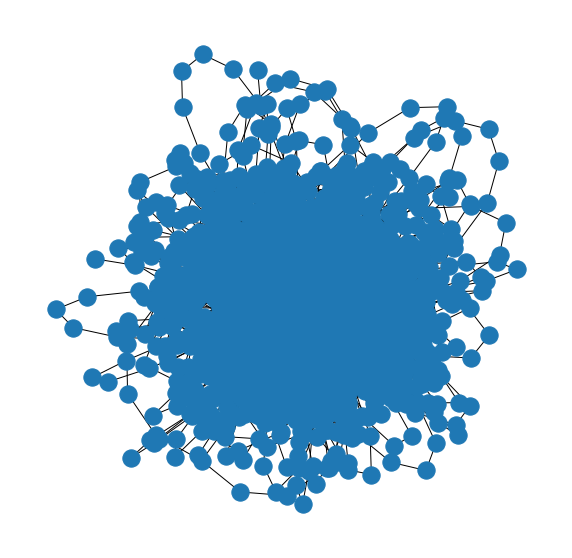

In [195]:
#Plotting a bigram graph network
bigram_network_plot(tokenizing(tweet))

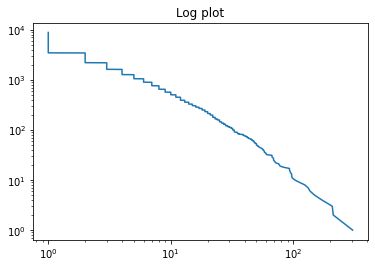

In [186]:
frquency_rank(datafrequently21) #Calling the frequency rank function
Log_Plot(frquency_rank(datafrequently21))  #Plotting the LOGLOG Plot

## TWEET YEAR 2022

In [187]:
#Data Reading For 2022 Year
dataf22=pd.read_csv('2022.csv')
dataf22.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1500030191837589510,1499972826828259328,2022-03-05 12:47:21 Arabian Standard Time,2022-03-05,12:47:21,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'SpacePadreIsle', 'name': 'SP...",NaN,NaN,NaN,NaN
1,1500028396436340736,1499802655421448192,2022-03-05 12:40:13 Arabian Standard Time,2022-03-05,12:40:13,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'teslaownersSV', 'name': 'Tes...",NaN,NaN,NaN,NaN
2,1500026380704178178,1499972826828259328,2022-03-05 12:32:12 Arabian Standard Time,2022-03-05,12:32:12,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'SpacePadreIsle', 'name': 'SP...",NaN,NaN,NaN,NaN
3,1500010328758923264,1499976967105433600,2022-03-05 11:28:25 Arabian Standard Time,2022-03-05,11:28:25,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'RationalEtienne', 'name': 'P...",NaN,NaN,NaN,NaN
4,1499982913949081600,1499976967105433600,2022-03-05 09:39:29 Arabian Standard Time,2022-03-05,09:39:29,400,44196397,elonmusk,Elon Musk,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'RogerYar', 'name': 'Дід Пана...",NaN,NaN,NaN,NaN


In [188]:
tweet=combining(dataf22)  #Calling the combining function
tokenizing(tweet)  #Calling the Tokenizing Function

[('spacepadreisle', 'way'), ('way', 'free'), ('free', 'qa'), ('qa', 'haha'), ('haha', 'teslaownerssv'), ('teslaownerssv', 'beautiful'), ('beautiful', 'home'), ('home', 'life'), ('life', 'spacepadreisle'), ('spacepadreisle', 'starlink'), ('starlink', 'terminals'), ('terminals', 'near'), ('near', 'conflict'), ('conflict', 'areas'), ('areas', 'jammed'), ('jammed', 'several'), ('several', 'hours'), ('hours', 'time'), ('time', 'latest'), ('latest', 'software'), ('software', 'update'), ('update', 'bypasses'), ('bypasses', 'jamming'), ('jamming', 'curious'), ('curious', 'see'), ('see', 'whats'), ('whats', 'next'), ('next', 'rationaletienne'), ('rationaletienne', 'rogeryar'), ('rogeryar', 'exactly'), ('exactly', 'rogeryar'), ('rogeryar', 'news'), ('news', 'sources'), ('sources', 'partially'), ('partially', 'propaganda'), ('propaganda', 'others'), ('others', 'starlink'), ('starlink', 'told'), ('told', 'governments'), ('governments', 'not'), ('not', 'ukraine'), ('ukraine', 'block'), ('block', 'r

<generator object bigrams at 0x7f17bc99c6d0>

In [190]:
# THE most used words in the tweets of Elon Musk
datafrequently22 = frequency(tweet)
df22= datafrequently22.head(10)
datafrequently22.head(10)

,Word,Frequency
0,tesla,108
1,wholemarsblog,84
2,amp,80
3,spacex,56
4,teslaownerssv,50
5,sawyermerritt,36
6,people,34
7,yes,32
8,would,30
9,one,30


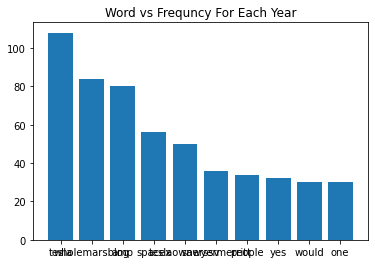

<Figure size 1440x1440 with 0 Axes>

In [191]:
#Plotting a histogram
plt.bar(df22['Word'],df22['Frequency'])
plt.title('Word vs Frequncy For Each Year')
plt.figure(figsize=(20,20)) 
plt.show()

[('spacepadreisle', 'way'), ('way', 'free'), ('free', 'qa'), ('qa', 'haha'), ('haha', 'teslaownerssv'), ('teslaownerssv', 'beautiful'), ('beautiful', 'home'), ('home', 'life'), ('life', 'spacepadreisle'), ('spacepadreisle', 'starlink'), ('starlink', 'terminals'), ('terminals', 'near'), ('near', 'conflict'), ('conflict', 'areas'), ('areas', 'jammed'), ('jammed', 'several'), ('several', 'hours'), ('hours', 'time'), ('time', 'latest'), ('latest', 'software'), ('software', 'update'), ('update', 'bypasses'), ('bypasses', 'jamming'), ('jamming', 'curious'), ('curious', 'see'), ('see', 'whats'), ('whats', 'next'), ('next', 'rationaletienne'), ('rationaletienne', 'rogeryar'), ('rogeryar', 'exactly'), ('exactly', 'rogeryar'), ('rogeryar', 'news'), ('news', 'sources'), ('sources', 'partially'), ('partially', 'propaganda'), ('propaganda', 'others'), ('others', 'starlink'), ('starlink', 'told'), ('told', 'governments'), ('governments', 'not'), ('not', 'ukraine'), ('ukraine', 'block'), ('block', 'r

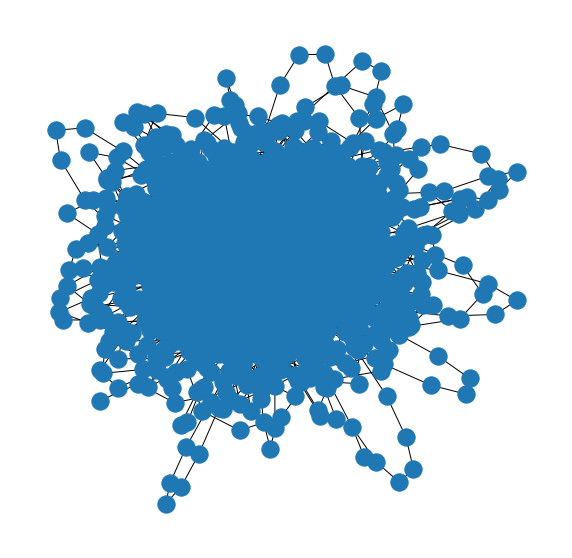

In [194]:
#Plotting a bigram graph network
bigram_network_plot(tokenizing(tweet))

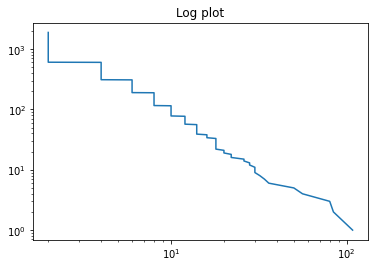

In [193]:
frquency_rank(datafrequently22) #Calling the frequency rank function
Log_Plot(frquency_rank(datafrequently22))  #Plotting the LOGLOG Plot